# Computer Vision - Lego Pieces Detection

We need to find:
. The number of lego pieces
- The position of each lego piece in the image
- The number of different colors

We will use OpenCV library to detect the lego pieces and the colors.

Let's start by importing the necessary libraries. Let's also import some simple auxiliary functions to help us.

In [2]:
import cv2
import numpy as np
import os
import math
from matplotlib import pyplot as plt
from scripts.utils import *
from scripts.edges import *

dataDir = 'samples-task1'

The steps will be:

- Object detection
    - Edge detection
    - Contour detection
    - Bounding box detection

- Color Analysis

- Final Results

Let's start by reading the image and displaying it.

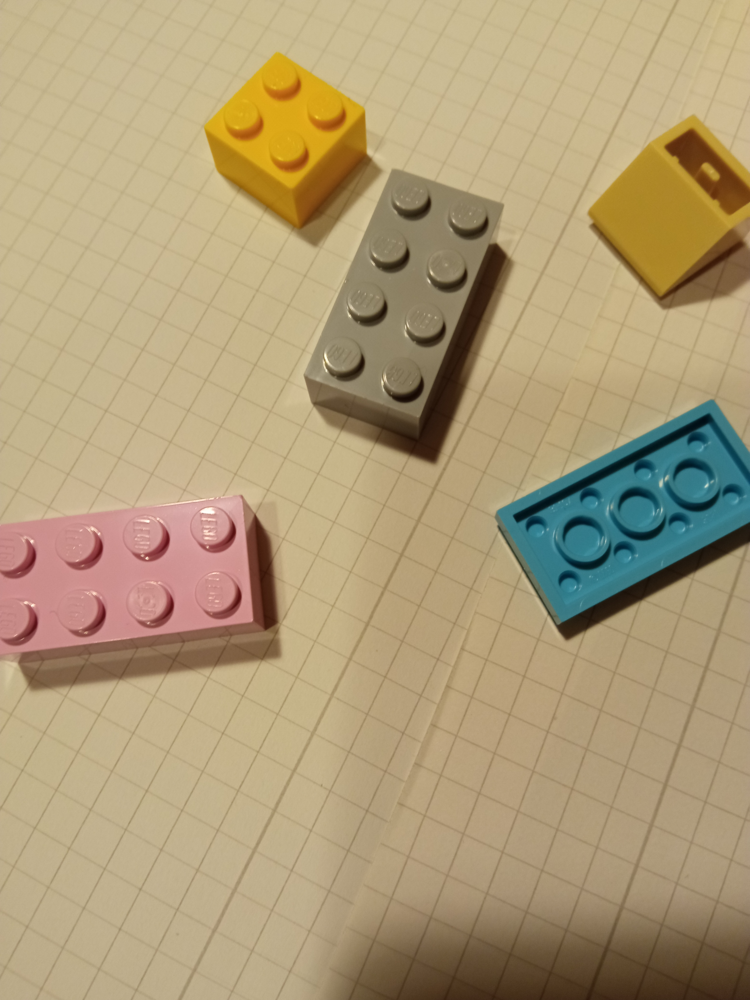

In [3]:
img = cv2.imread(os.path.join(dataDir, 'IMG_20201127_234550.jpg'))
showImages([img], ['Original'], False)

Let's start by implementing Edge Detection.

In [4]:
img = cv2.imread(os.path.join(dataDir, 'IMG_20201127_234550.jpg'))
imgCanny = applyCanny(img)
imgLines, lines = applyHoughLines(img, imgCanny)
showImages([imgCanny, imgLines], ['Canny', 'Hough Lines'], True)

As you can see, we need to adjust the parameters to get the best result.

Let's use a trackbar to adjust the parameters.

In [7]:
# Use trackbars to find the best parameters for Canny and see how it affects Hough Lines
def updateCannyThreshold(value):
    global img
    low = cv2.getTrackbarPos('Low', 'Canny')
    high = cv2.getTrackbarPos('High', 'Canny')
    imgCanny = applyCanny(img, low, high)
    imgLines, lines = applyHoughLines(img, imgCanny)
    imgCannyResized = resizeImage(imgCanny, 1080, 1920)
    imgLinesResized = resizeImage(imgLines, 1080, 1920)
    cv2.imshow('Canny', imgCannyResized)
    cv2.imshow('Hough Lines', imgLinesResized)

low = 50
high = 150
cv2.namedWindow('Canny')
cv2.createTrackbar('Low', 'Canny', 0, 255, updateCannyThreshold)
cv2.createTrackbar('High', 'Canny', 0, 255, updateCannyThreshold)

cv2.setTrackbarPos('Low', 'Canny', low)
cv2.setTrackbarPos('High', 'Canny', high)

imgCannyResized = resizeImage(imgCanny, 1080, 1920)
imgLinesResized = resizeImage(imgLines, 1080, 1920)
cv2.imshow('Canny', imgCannyResized)
cv2.imshow('Hough Lines', imgLinesResized)
wait('Canny')
wait('Hough Lines')
cv2.destroyAllWindows()
